# 1. 강의영상 

In [1]:
pass

# 2. Imports 

In [5]:
import numpy as np
import pandas as pd
#---#
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.subplots

In [6]:
pd.options.plotting.backend = "plotly"
pio.templates.default = "plotly_white"

# 3. 아이스크림을 많이 먹으면 걸리는 병 

In [3]:
`-`항

2

## A. 자료 

In [170]:
np.random.seed(42)
temp=pd.read_csv('https://raw.githubusercontent.com/guebin/DV2022/master/posts/temp.csv').iloc[:,3].to_numpy()
sales = 20 + 2 * temp + np.random.randn(len(temp))*7 # 온도 -> 아이크림판매량
diss1 = 30 + 0.5 * temp + np.random.randn(len(temp))*1 # 온도 -> 소아마비반응수치
diss2 = 30 + 0.15 * sales + np.random.randn(len(temp))*1 # 아이스크림판매량 -> 소아마비반응수치 
df1 = pd.DataFrame({'temp':temp,'diss':diss1,'sales':sales})
df2 = pd.DataFrame({'temp':temp,'diss':diss2,'sales':sales})

## B. Scatter + Line 

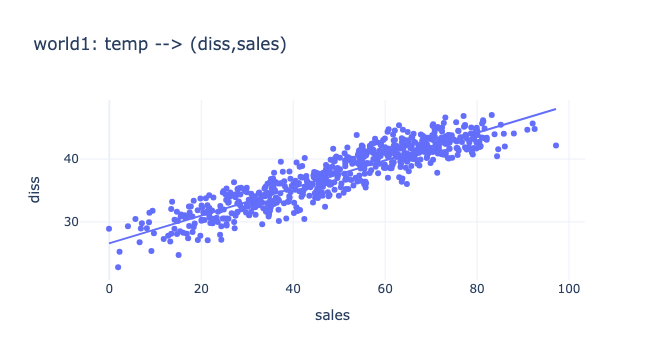

In [171]:
df1.plot.scatter(
    x='sales',
    y='diss', 
    title='world1: temp --> (diss,sales)',
    trendline = 'ols', # ols ,lowess
)

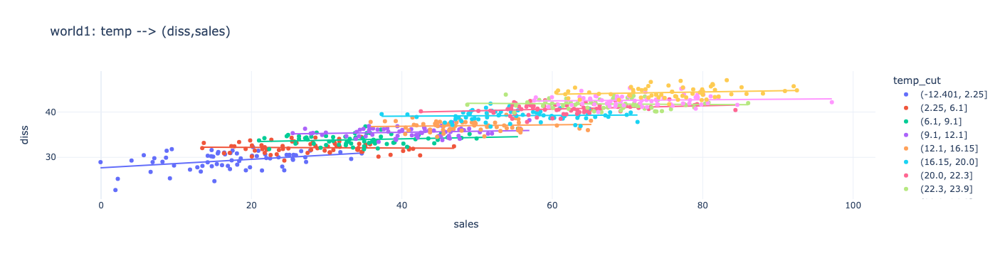

In [172]:
df1.assign(temp_cut = lambda df: pd.qcut(df.temp,10)).sort_values('temp_cut')\
.plot.scatter(
    x='sales',
    y='diss',
    color='temp_cut',
    trendline='ols',
    title='world1: temp --> (diss,sales)',
)

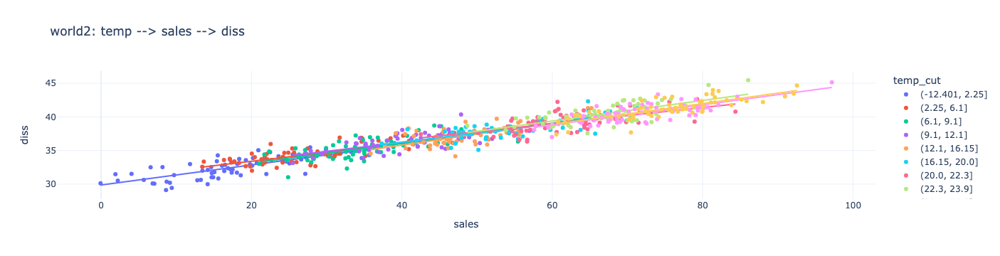

In [173]:
df2.assign(temp_cut = lambda df: pd.qcut(df.temp,10)).sort_values('temp_cut')\
.plot.scatter(
    x='sales',
    y='diss',
    color='temp_cut',
    trendline='ols',
    title='world2: temp --> sales --> diss',
)

# NCY

In [206]:
df = pd.read_csv("https://raw.githubusercontent.com/guebin/DV2023/main/posts/NYCTaxi.csv")
df = df.assign(
    log_trip_duration = np.log(df.trip_duration),
    pickup_datetime = df.pickup_datetime.apply(pd.to_datetime),
    dropoff_datetime = df.dropoff_datetime.apply(pd.to_datetime),
    dist = np.sqrt((df.pickup_latitude-df.dropoff_latitude)**2 + (df.pickup_longitude-df.dropoff_longitude)**2),
    #---#
    vendor_id = df.vendor_id.map({1:'A',2:'B'})
).assign(
    speed = lambda df: df.dist / df.trip_duration,
    pickup_hour = lambda df: df.pickup_datetime.dt.hour,
    dropoff_hour = lambda df: df.dropoff_datetime.dt.hour,
    dayofweek = lambda df: df.pickup_datetime.dt.dayofweek
)

In [208]:
df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,log_trip_duration,dist,speed,pickup_hour,dropoff_hour,dayofweek
0,id2875421,B,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,6.120297,0.017680,0.000039,17,17,0
1,id3194108,A,2016-06-01 11:48:41,2016-06-01 12:19:07,1,-74.005028,40.746452,-73.972008,40.745781,N,1826,7.509883,0.033027,0.000018,11,12,2
2,id3564028,A,2016-01-02 01:16:42,2016-01-02 01:19:56,1,-73.954132,40.774784,-73.947418,40.779633,N,194,5.267858,0.008282,0.000043,1,1,5
3,id1660823,B,2016-03-01 06:40:18,2016-03-01 07:01:37,5,-73.982140,40.775326,-74.009850,40.721699,N,1279,7.153834,0.060363,0.000047,6,7,1
4,id1575277,B,2016-06-11 16:59:15,2016-06-11 17:33:27,1,-73.999229,40.722881,-73.982880,40.778297,N,2052,7.626570,0.057778,0.000028,16,17,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14582,id3647353,A,2016-05-16 22:12:09,2016-05-16 22:27:46,1,-73.990219,40.737076,-73.986748,40.702194,N,937,6.842683,0.035054,0.000037,22,22,0
14583,id2064944,A,2016-05-23 08:04:35,2016-05-23 08:19:20,1,-73.987068,40.730728,-73.974983,40.751331,N,885,6.785588,0.023886,0.000027,8,8,0
14584,id3286731,B,2016-05-31 16:56:13,2016-05-31 17:38:44,1,-73.863541,40.769711,-73.994644,40.750435,N,2551,7.844241,0.132513,0.000052,16,17,1
14585,id3453691,B,2016-03-07 18:11:54,2016-03-07 18:29:09,1,-74.006531,40.738232,-73.985970,40.726978,N,1035,6.942157,0.023439,0.000023,18,18,0


In [211]:
df.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration', 'log_trip_duration', 'dist', 'speed', 'pickup_hour',
       'dropoff_hour', 'dayofweek'],
      dtype='object')

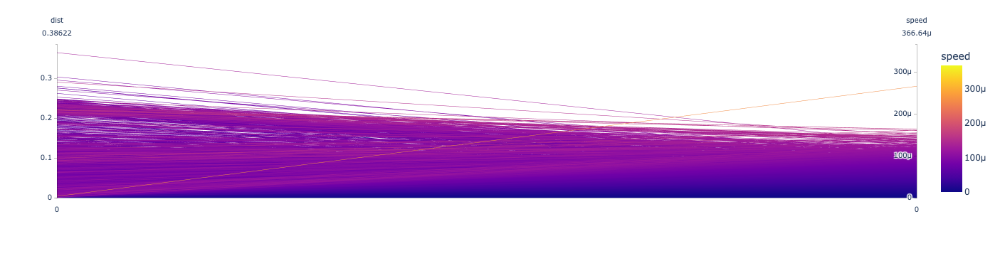

In [215]:
tidydata = df 
fig = px.parallel_coordinates(
    data_frame=tidydata,
    color='speed',
    dimensions=['dist','speed']
)
fig

## C. 

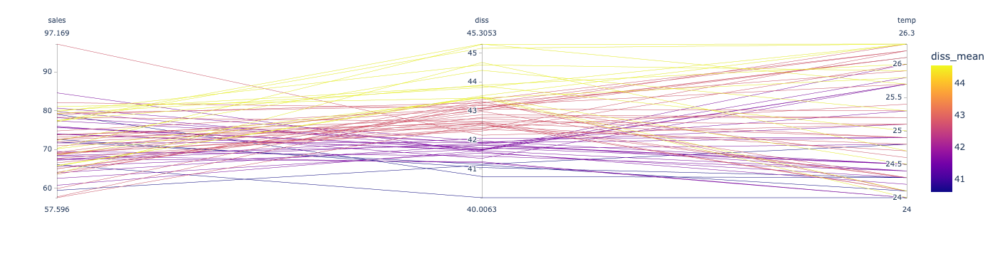

In [199]:
big =  df1.assign(
    temp_cut = lambda df: pd.qcut(df.temp,10,labels=list('0123456789')),
    sales_cut = lambda df: pd.qcut(df.sales,4,labels=['Q1','Q2','Q3','Q4']),
    diss_cut = lambda df: pd.qcut(df.diss,10)
)
small = big.groupby('diss_cut').agg({'diss':'mean'}).reset_index().rename({'diss':'diss_mean'},axis=1)
tidydata = big.merge(small).query("temp_cut == '8'")
#---#
fig = px.parallel_coordinates(
    data_frame=tidydata,
    color='diss_mean',
    dimensions=['sales','diss','temp']
)
fig

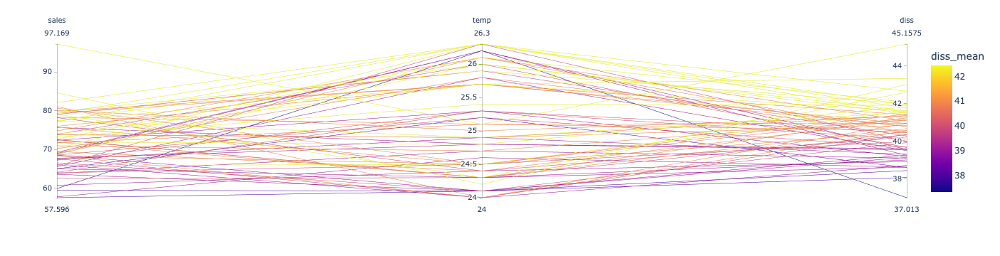

In [200]:
big =  df2.assign(
    temp_cut = lambda df: pd.qcut(df.temp,10,labels=list('0123456789')),
    sales_cut = lambda df: pd.qcut(df.sales,4,labels=['Q1','Q2','Q3','Q4']),
    diss_cut = lambda df: pd.qcut(df.diss,10)
)
small = big.groupby('diss_cut').agg({'diss':'mean'}).reset_index().rename({'diss':'diss_mean'},axis=1)
tidydata = big.merge(small).query("temp_cut == '8'")
#---#
fig = px.parallel_coordinates(
    data_frame=tidydata,
    color='diss_mean',
    dimensions=['sales','temp','diss']
)
fig

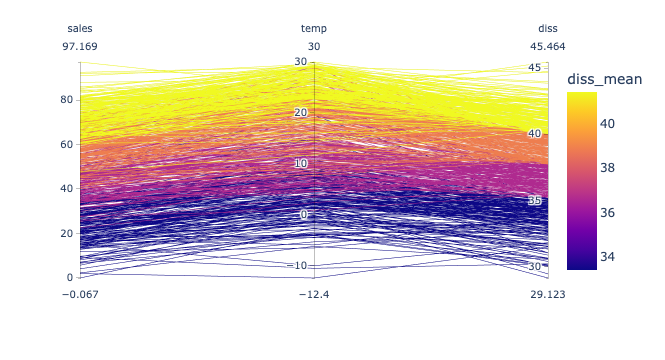

In [201]:
big =  df2.assign(diss_cut = lambda df: pd.qcut(df.diss,4)).sort_values('diss_cut')
small = big.groupby('diss_cut').agg({'diss':'mean'}).reset_index().rename({'diss':'diss_mean'},axis=1)
tidydata = big.merge(small)
#---#
fig = px.parallel_coordinates(
    data_frame=tidydata,
    color='diss_mean',
    dimensions=['sales','temp','diss']
)
fig

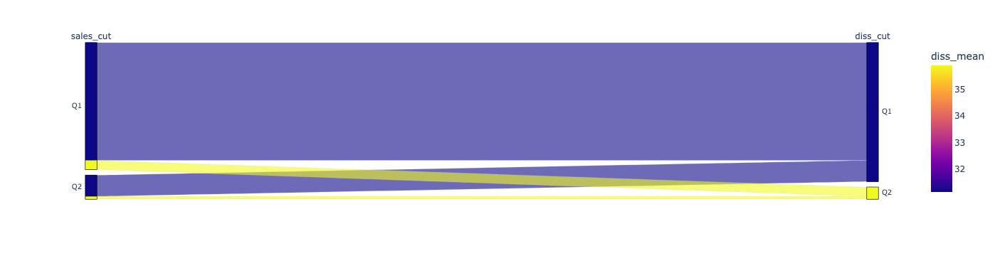

In [202]:
big =  df1.assign(
    temp_cut = lambda df: pd.qcut(df.temp,4,labels=['Q1','Q2','Q3','Q4']),
    sales_cut = lambda df: pd.qcut(df.sales,4,labels=['Q1','Q2','Q3','Q4']),
    diss_cut = lambda df: pd.qcut(df.diss,4,labels=['Q1','Q2','Q3','Q4'])
)
small = big.groupby('diss_cut').agg({'diss':'mean'}).reset_index().rename({'diss':'diss_mean'},axis=1)
tidydata = big.merge(small).query("temp_cut == 'Q1'")
#---#
fig = px.parallel_categories(
    data_frame=tidydata,
    color='diss_mean',
    dimensions=['sales_cut','diss_cut']
)
fig

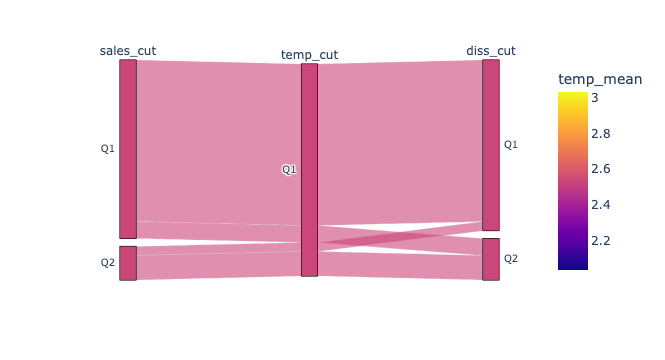

In [178]:
big =  df2.assign(
    temp_cut = lambda df: pd.qcut(df.temp,4,labels=['Q1','Q2','Q3','Q4']),
    sales_cut = lambda df: pd.qcut(df.sales,4,labels=['Q1','Q2','Q3','Q4']),
    diss_cut = lambda df: pd.qcut(df.diss,4,labels=['Q1','Q2','Q3','Q4'])
)
small = big.groupby('temp_cut').agg({'temp':'mean'}).reset_index().rename({'temp':'temp_mean'},axis=1)
tidydata = big.merge(small).query("temp_cut == 'Q1'")
#---#
fig = px.parallel_categories(
    data_frame=tidydata,
    color='temp_mean',
    dimensions=['sales_cut','temp_cut','diss_cut']
)
fig

In [149]:
tidydata

,temp,diss,sales,temp_cut,sales_cut,diss_cut,temp_mean
0,-0.5,28.513929,22.476999,Q1,Q1,Q1,2.533537
1,1.4,34.175875,21.832150,Q1,Q1,Q1,2.533537
2,2.6,37.998085,29.733820,Q1,Q1,Q1,2.533537
3,2.0,35.855640,34.661209,Q1,Q1,Q1,2.533537
4,2.5,36.926338,23.360926,Q1,Q1,Q1,2.533537
...,...,...,...,...,...,...,...
651,24.5,103.209725,80.683151,Q4,Q4,Q4,25.965625
652,25.2,105.867392,68.582861,Q4,Q4,Q4,25.965625
653,23.6,101.121698,56.677999,Q4,Q3,Q4,25.965625
654,24.0,101.244255,67.619936,Q4,Q4,Q4,25.965625


In [150]:
tidydata = pd.DataFrame({'temp':temp,'diss':disease,'sales':icecream_sales})\
.assign(
    temp_cut = lambda df: pd.qcut(df.temp,q=4,labels=['Q1','Q2','Q3','Q4']),
    diss_cut = lambda df: pd.qcut(df.diss,q=4,labels=['Q1','Q2','Q3','Q4']),
    sales_cut = lambda df: pd.qcut(df.sales,q=4,labels=['Q1','Q2','Q3','Q4']),
)
display(tidydata)
#---#
px.parallel_categories(
    data_frame=tidydata,
    color='diss',
    dimensions=['temp_cut','diss_cut', 'sales_cut']
)

NameError: name 'disease' is not defined

# 3. px.

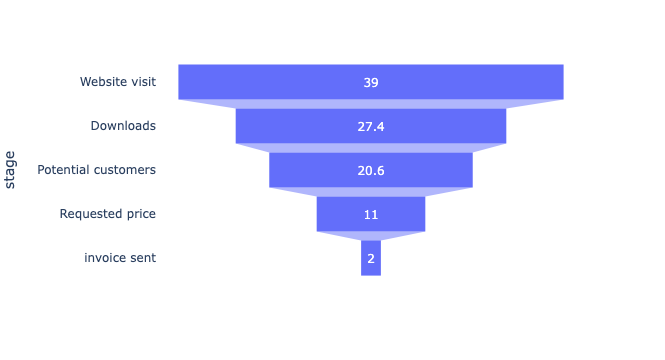

In [3]:
data = dict(
    number=[39, 27.4, 20.6, 11, 2],
    stage=["Website visit", "Downloads", "Potential customers", "Requested price", "invoice sent"])
fig = px.funnel(data, x='number', y='stage')
fig.show()

In [5]:
pd.DataFrame(data)

,number,stage
0,39.0,Website visit
1,27.4,Downloads
2,20.6,Potential customers
3,11.0,Requested price
4,2.0,invoice sent


# 3. pie, 

## A. `px.pie`

In [6]:
df = pd.read_csv('https://raw.githubusercontent.com/guebin/DV2021/master/_notebooks/2021-10-25-FIFA22_official_data.csv').loc[:,lambda df: df.isna().mean()<0.5].dropna()

In [7]:
continent_mapping = {
    'Asia': ['Afghanistan', 'Japan', 'Macau', 'Chinese Taipei', 'Indonesia', 'Korea Republic', 'Kazakhstan', 'Kyrgyzstan', 'Bhutan', 'Philippines', 'Syria', 'China PR', 'Oman', 'Guam', 'Vietnam', 'Jordan', 'Palestine', 'Malaysia', 'Hong Kong', 'Korea DPR', 'Lebanon', 'Uzbekistan', 'India','Iraq', 'Iran', 'Saudi Arabia', 'United Arab Emirates','Australia'],
    'Europe': ['Portugal', 'Germany', 'Belgium', 'Netherlands', 'Croatia', 'Spain', 'Austria', 'Italy', 'France', 'Serbia', 'England', 'Poland', 'Ukraine', 'Wales', 'Scotland', 'Czech Republic', 'Slovakia', 'Romania', 'Bosnia and Herzegovina', 'Republic of Ireland', 'Norway', 'Sweden', 'Bulgaria', 'Lithuania', 'Estonia', 'Latvia', 'Liechtenstein','Albania','Denmark','Finland','Greece','Hungary','Iceland','Luxembourg','Northern Ireland','Slovenia','Switzerland','Andorra','Azerbaijan','Belarus','Cyprus','Faroe Islands','Georgia','Kosovo','Malta','Moldova','Montenegro','North Macedonia','Armenia','Gibraltar','Russia','Turkey','Israel'],
    'South America': ['Uruguay', 'Argentina', 'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Paraguay', 'Venezuela', 'Suriname', 'Bolivia','Peru','Guyana'],
    'Africa': ['Egypt', "Côte d'Ivoire", 'Senegal', 'Morocco', 'Ghana', 'Algeria', 'Guinea', 'Mali', 'Congo DR', 'Liberia', 'Cameroon', 'Tunisia', 'Comoros', 'Kenya', 'South Africa', 'Zimbabwe', 'Madagascar', 'Mozambique', 'Equatorial Guinea', 'Congo', 'Burundi', 'Grenada', 'Thailand', 'Togo', 'Sudan', 'Mauritania','Guinea Bissau','Libya','Nigeria','Zambia','Angola','Benin','Burkina Faso','Cape Verde Islands','Central African Republic','Chad','Eritrea','Gabon','Gambia','Mauritius','Namibia','Rwanda','Sierra Leone','South Sudan','São Tomé e Príncipe','Uganda','Niger'],
    'North and Central America': ['Antigua and Barbuda', 'Barbados', 'Belize', 'Bermuda', 'Canada', 'Costa Rica', 'Cuba', 'Curacao', 'Dominican Republic', 'El Salvador', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Montserrat', 'Panama', 'Puerto Rico', 'Saint Kitts and Nevis', 'Saint Lucia', 'Trinidad and Tobago', 'United States'],
    'Oceania': ['New Zealand', 'Fiji', 'Papua New Guinea','New Caledonia'],
}

In [8]:
df.assign(
    Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]
)

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,...,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Position,Best Overall Rating,Release Clause,DefensiveAwareness,Continent
0,212198,Bruno Fernandes,26,https://cdn.sofifa.com/players/212/198/22_60.png,Portugal,https://cdn.sofifa.com/flags/pt.png,88,89,Manchester United,https://cdn.sofifa.com/teams/11/30.png,...,12.0,14.0,15.0,8.0,14.0,CAM,88.0,€206.9M,72.0,Europe
1,209658,L. Goretzka,26,https://cdn.sofifa.com/players/209/658/22_60.png,Germany,https://cdn.sofifa.com/flags/de.png,87,88,FC Bayern München,https://cdn.sofifa.com/teams/21/30.png,...,13.0,8.0,15.0,11.0,9.0,CM,87.0,€160.4M,74.0,Europe
2,176580,L. Suárez,34,https://cdn.sofifa.com/players/176/580/22_60.png,Uruguay,https://cdn.sofifa.com/flags/uy.png,88,88,Atlético de Madrid,https://cdn.sofifa.com/teams/240/30.png,...,27.0,25.0,31.0,33.0,37.0,ST,88.0,€91.2M,42.0,South America
3,192985,K. De Bruyne,30,https://cdn.sofifa.com/players/192/985/22_60.png,Belgium,https://cdn.sofifa.com/flags/be.png,91,91,Manchester City,https://cdn.sofifa.com/teams/10/30.png,...,15.0,13.0,5.0,10.0,13.0,CM,91.0,€232.2M,68.0,Europe
4,224334,M. Acuña,29,https://cdn.sofifa.com/players/224/334/22_60.png,Argentina,https://cdn.sofifa.com/flags/ar.png,84,84,Sevilla FC,https://cdn.sofifa.com/teams/481/30.png,...,8.0,14.0,13.0,13.0,14.0,LB,84.0,€77.7M,80.0,South America
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16703,259718,F. Gebhardt,19,https://cdn.sofifa.com/players/259/718/22_60.png,Germany,https://cdn.sofifa.com/flags/de.png,52,66,FC Basel 1893,https://cdn.sofifa.com/teams/896/30.png,...,53.0,45.0,47.0,52.0,57.0,GK,52.0,€361K,6.0,Europe
16704,251433,B. Voll,20,https://cdn.sofifa.com/players/251/433/22_60.png,Germany,https://cdn.sofifa.com/flags/de.png,58,69,F.C. Hansa Rostock,https://cdn.sofifa.com/teams/27/30.png,...,59.0,60.0,56.0,55.0,61.0,GK,58.0,€656K,5.0,Europe
16706,262846,�. Dobre,20,https://cdn.sofifa.com/players/262/846/22_60.png,Romania,https://cdn.sofifa.com/flags/ro.png,53,63,FC Academica Clinceni,https://cdn.sofifa.com/teams/113391/30.png,...,57.0,52.0,53.0,48.0,58.0,GK,53.0,€279K,5.0,Europe
16707,241317,21 Xue Qinghao,19,https://cdn.sofifa.com/players/241/317/21_60.png,China PR,https://cdn.sofifa.com/flags/cn.png,47,60,Shanghai Shenhua FC,https://cdn.sofifa.com/teams/110955/30.png,...,49.0,48.0,45.0,38.0,52.0,GK,47.0,€223K,21.0,Asia


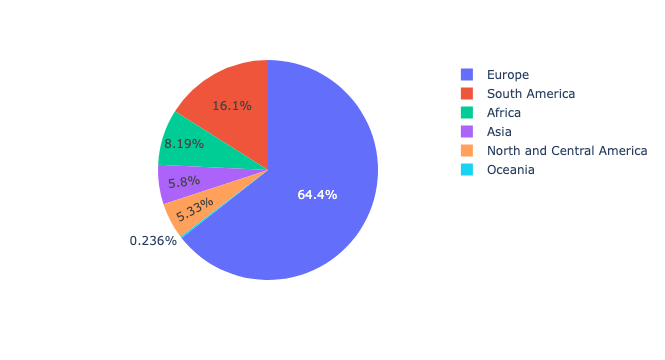

In [9]:
tidydata = df.assign(
    Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]
).groupby('Continent').agg({'ID':'count'}).reset_index().rename({'ID':'Count'},axis=1)
px.pie(
    data_frame=tidydata,
    names = 'Continent',
    values = 'Count',
)
#tidydata

`-` pie chart with hole

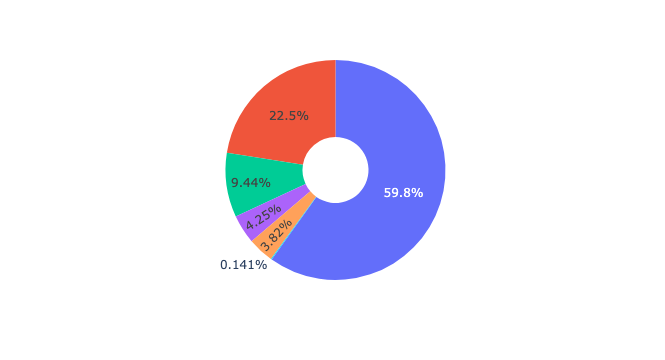

In [10]:
tidydata = df.assign(
    Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]

).query('Overall > Overall.mean()')\
.groupby('Continent').agg({'ID':'count'}).reset_index().rename({'ID':'Count'},axis=1)
#---#
px.pie(
    data_frame=tidydata,
    labels = 'Continent',
    values = 'Count',
    hole = 0.3
)
#tidydata

`-` 

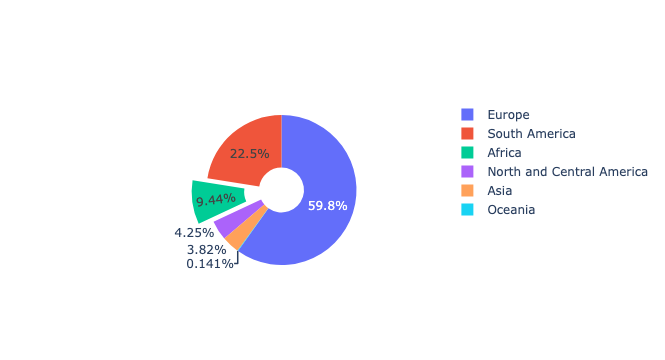

In [11]:
tidydata = df.assign(
    Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]

).query('Overall > Overall.mean()')\
.groupby('Continent').agg({'ID':'count'}).reset_index().rename({'ID':'Count'},axis=1)
#---#
go.Figure(
    data = go.Pie(labels = tidydata.Continent, values= tidydata.Count, pull = [0.2,0,0,0,0,0],hole=0.3)
)

In [12]:
a=list([1,2,3])

## B. `px.sunburst`

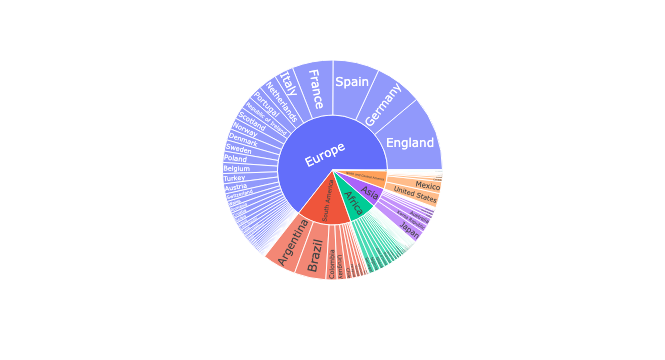

In [13]:
tidydata = df.groupby('Nationality').agg('size').reset_index().rename({0:'Count'},axis=1)\
.assign(
    Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]
)
#---# 
px.sunburst(
    data_frame=tidydata, 
    path=['Continent','Nationality'],
    values='Count'
)

## C. `px.treemap`

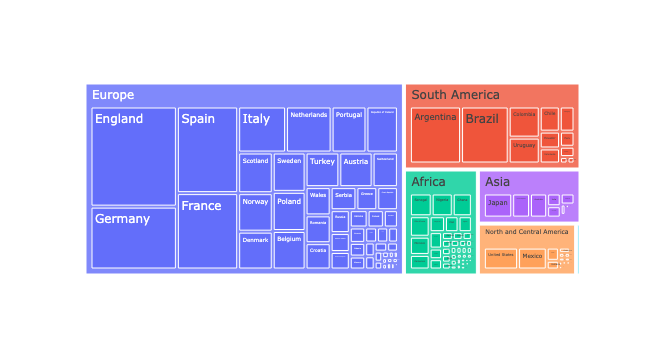

In [14]:
tidydata = df.groupby('Nationality').agg('size').reset_index().rename({0:'Count'},axis=1)\
.assign(
    Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]
)
#---# 
px.treemap(
    data_frame=tidydata, 
    path=['Continent','Nationality'],
    values='Count'
)

In [28]:
# tidydata = df.groupby('Nationality').agg('size').reset_index().rename({0:'Count'},axis=1)\
# .assign(
#     Continent = lambda df: [k for x in df['Nationality'] for k,v in continent_mapping.items() if x in v]
# )
# #---# 
# px.icicle(
#     data_frame=tidydata, 
#     path=['Continent','Nationality',],
#     values='Count'
# )

# 4. 

In [330]:
df = pd.read_csv('https://raw.githubusercontent.com/guebin/MP2023/main/posts/insurance.csv')
df

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


In [350]:
_df = df.assign(
    age_cut = lambda df: pd.qcut(df.age,q=4,labels=['Q1','Q2','Q3','Q4']),
    bmi_cut = lambda df: pd.qcut(df.bmi,q=3,labels=['low','midium','high']),
    charges_cut = lambda df: pd.qcut(df.charges,q=4,labels=['Q1','Q2','Q3','Q4']),
)

{'Q1': 2853.0894414925374,
 'Q2': 6991.862334038923,
 'Q3': 12106.074964071857,
 'Q4': 31108.444687432835}

In [356]:
_df

,age,sex,bmi,children,smoker,region,charges,age_cut,bmi_cut,charges_cut
0,19,female,27.900,0,yes,southwest,16884.92400,Q1,midium,Q4
1,18,male,33.770,1,no,southeast,1725.55230,Q1,high,Q1
2,28,male,33.000,3,no,southeast,4449.46200,Q2,midium,Q1
3,33,male,22.705,0,no,northwest,21984.47061,Q2,low,Q4
4,32,male,28.880,0,no,northwest,3866.85520,Q2,midium,Q1
...,...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,Q3,midium,Q3
1334,18,female,31.920,0,no,northeast,2205.98080,Q1,midium,Q1
1335,18,female,36.850,0,no,southeast,1629.83350,Q1,high,Q1
1336,21,female,25.800,0,no,southwest,2007.94500,Q1,low,Q1


In [369]:
tidydata = df.assign(
    age_cut = lambda df: pd.qcut(df.age,q=4,labels=['Q1','Q2','Q3','Q4']),
    bmi_cut = lambda df: pd.qcut(df.bmi,q=3,labels=['low','midium','high']),
    charges_cut = lambda df: pd.qcut(df.charges,q=4,labels=['Q1','Q2','Q3','Q4']),
).assign(
    charges_mean = lambda df: df.charges_cut.map(df.groupby('charges_cut').agg({'charges':'mean'}).rename({'charges':'charges_mean'},axis=1).to_dict()['charges_mean'])
)
tidydata

,age,sex,bmi,children,smoker,region,charges,age_cut,bmi_cut,charges_cut,charges_mean
0,19,female,27.900,0,yes,southwest,16884.92400,Q1,midium,Q4,31108.444687
1,18,male,33.770,1,no,southeast,1725.55230,Q1,high,Q1,2853.089441
2,28,male,33.000,3,no,southeast,4449.46200,Q2,midium,Q1,2853.089441
3,33,male,22.705,0,no,northwest,21984.47061,Q2,low,Q4,31108.444687
4,32,male,28.880,0,no,northwest,3866.85520,Q2,midium,Q1,2853.089441
...,...,...,...,...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830,Q3,midium,Q3,12106.074964
1334,18,female,31.920,0,no,northeast,2205.98080,Q1,midium,Q1,2853.089441
1335,18,female,36.850,0,no,southeast,1629.83350,Q1,high,Q1,2853.089441
1336,21,female,25.800,0,no,southwest,2007.94500,Q1,low,Q1,2853.089441


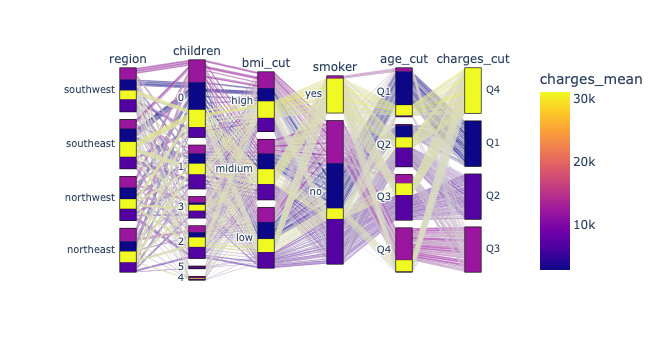

In [371]:
tidydata = df.assign(
    age_cut = lambda df: pd.qcut(df.age,q=4,labels=['Q1','Q2','Q3','Q4']),
    bmi_cut = lambda df: pd.qcut(df.bmi,q=3,labels=['low','midium','high']),
    charges_cut = lambda df: pd.qcut(df.charges,q=4,labels=['Q1','Q2','Q3','Q4']),
).assign(
    charges_mean = lambda df: df.charges_cut.map(df.groupby('charges_cut').agg({'charges':'mean'}).rename({'charges':'charges_mean'},axis=1).to_dict()['charges_mean'])
)
#---#
px.parallel_categories(
    data_frame=tidydata,
    color='charges_mean',
    dimensions=['smoker','age_cut','bmi_cut','region','children','charges_cut']
)

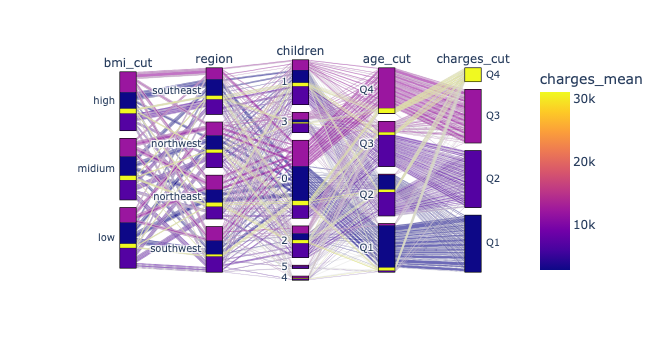

In [373]:
tidydata = df.assign(
    age_cut = lambda df: pd.qcut(df.age,q=4,labels=['Q1','Q2','Q3','Q4']),
    bmi_cut = lambda df: pd.qcut(df.bmi,q=3,labels=['low','midium','high']),
    charges_cut = lambda df: pd.qcut(df.charges,q=4,labels=['Q1','Q2','Q3','Q4']),
).assign(
    charges_mean = lambda df: df.charges_cut.map(df.groupby('charges_cut').agg({'charges':'mean'}).rename({'charges':'charges_mean'},axis=1).to_dict()['charges_mean'])
).query("smoker == 'no'")
#---#
px.parallel_categories(
    data_frame=tidydata,
    color='charges_mean',
    dimensions=['age_cut','bmi_cut','region','children','charges_cut']
)

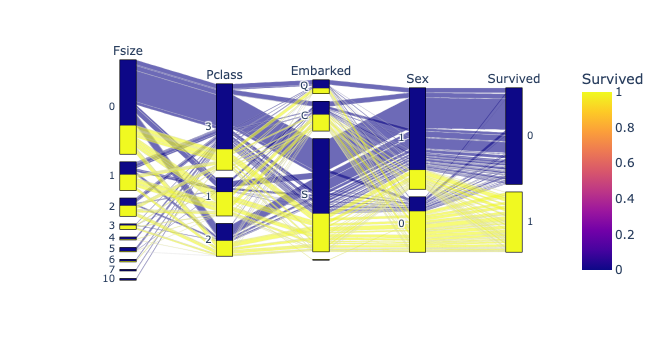

In [412]:
tidydata = df.assign(
    Fsize = lambda df: df['SibSp'] + df['Parch'],
    Sex = lambda df: df['Sex'].map({'female':0,'male':1}),
).sort_values('Fsize')
px.parallel_categories(
    data_frame=tidydata,
    color='Survived',
    dimensions=['Fsize','Pclass','Embarked','Sex','Survived']
)

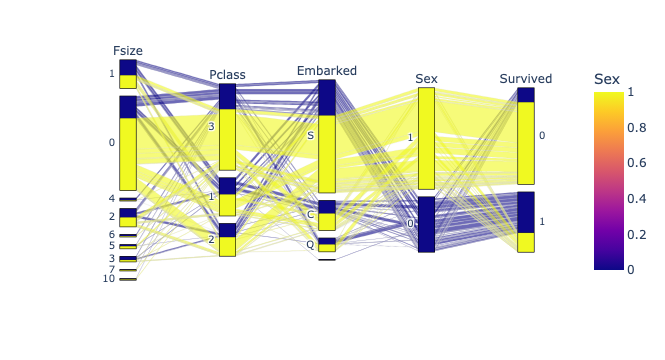

In [413]:
tidydata = df.assign(
    Fsize = lambda df: df['SibSp'] + df['Parch'],
    Sex = lambda df: df['Sex'].map({'female':0,'male':1}),
)
px.parallel_categories(
    data_frame=tidydata,
    color='Sex',
    dimensions=['Fsize','Pclass','Embarked','Sex','Survived']
)

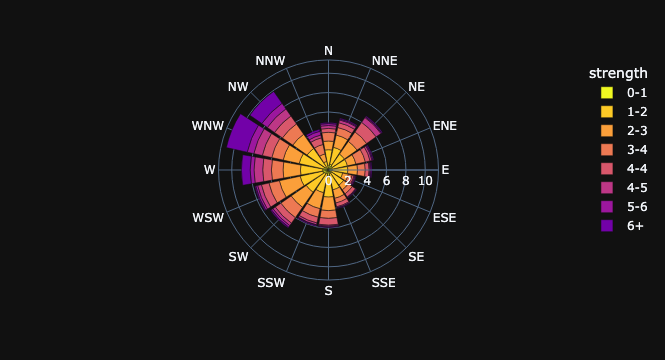

In [399]:
df = px.data.wind()
fig = px.bar_polar(df, r="frequency", theta="direction",
                   color="strength", template="plotly_dark",
                   color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()

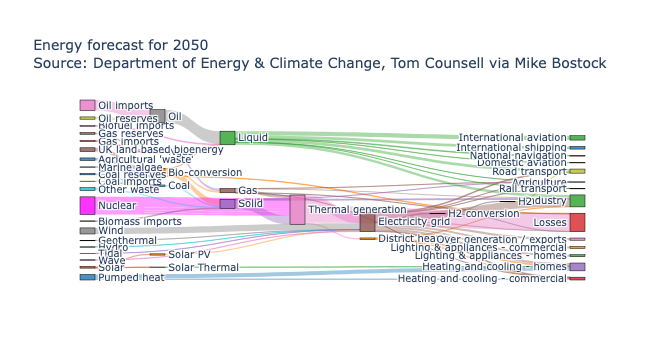

In [400]:
import plotly.graph_objects as go
import urllib, json

url = 'https://raw.githubusercontent.com/plotly/plotly.js/master/test/image/mocks/sankey_energy.json'
response = urllib.request.urlopen(url)
data = json.loads(response.read())

# override gray link colors with 'source' colors
opacity = 0.4
# change 'magenta' to its 'rgba' value to add opacity
data['data'][0]['node']['color'] = ['rgba(255,0,255, 0.8)' if color == "magenta" else color for color in data['data'][0]['node']['color']]
data['data'][0]['link']['color'] = [data['data'][0]['node']['color'][src].replace("0.8", str(opacity))
                                    for src in data['data'][0]['link']['source']]

fig = go.Figure(data=[go.Sankey(
    valueformat = ".0f",
    valuesuffix = "TWh",
    # Define nodes
    node = dict(
      pad = 15,
      thickness = 15,
      line = dict(color = "black", width = 0.5),
      label =  data['data'][0]['node']['label'],
      color =  data['data'][0]['node']['color']
    ),
    # Add links
    link = dict(
      source =  data['data'][0]['link']['source'],
      target =  data['data'][0]['link']['target'],
      value =  data['data'][0]['link']['value'],
      label =  data['data'][0]['link']['label'],
      color =  data['data'][0]['link']['color']
))])

fig.update_layout(title_text="Energy forecast for 2050<br>Source: Department of Energy & Climate Change, Tom Counsell via <a href='https://bost.ocks.org/mike/sankey/'>Mike Bostock</a>",
                  font_size=10)
fig.show()